<a href="https://colab.research.google.com/github/dequiroz/1MTR53_RobIA/blob/main/end_to_end.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/drive/12eZx8jw4P_UKozmXYUGsC67X8T6kJnxL">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/examples/blob/master/courses/udacity_intro_to_tensorflow_lite/tflite_c04_exercise_convert_model_to_tflite_solution.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
</table>

#Environment Setup


## Import Dependencies

In [1]:
import os
import csv
import cv2
import matplotlib.pyplot as plt
import random
import pprint
import numpy as np
import pandas as pd
import sklearn
from numpy import expand_dims
from sklearn.model_selection import train_test_split

import tensorflow as tf
# Use the tensorflow.keras path for Keras 3 compatibility in Colab
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, MaxPooling2D,
                                     Lambda, Cropping2D, Flatten, Dropout,
                                     SpatialDropout2D, Conv2D)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (ModelCheckpoint, TensorBoard,
                                        EarlyStopping, ReduceLROnPlateau)
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Native Colab patches for displaying images
from google.colab.patches import cv2_imshow

# Load the native TensorBoard extension (replaces tensorboardcolab)
%load_ext tensorboard

print("Tensorflow Version:", tf.__version__)
print("Keras Version:", tf.keras.__version__) # Add this line back
print("Eager mode: ", tf.executing_eagerly())

Tensorflow Version: 2.19.0
Keras Version: 3.10.0
Eager mode:  True


## Confirm TensorFlow can see the GPU

Simply select "GPU" in the Accelerator drop-down in Notebook Settings (either through the Edit menu or the command palette at cmd/ctrl-shift-P).

In [2]:
device_name = tf.test.gpu_device_name()

if device_name != '/device:GPU:0':
  #raise SystemError('GPU device not found')
  print('GPU device not found')
else:
  print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


# Load Dataset

## Download and Extract the Dataset

In [3]:
# Download the dataset
!curl -O https://selbystorage.s3-us-west-2.amazonaws.com/research/office_2/office_2.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  964M  100  964M    0     0  31.1M      0  0:00:30  0:00:30 --:--:-- 32.0M


In [4]:
data_set = 'office_2'
tar_file = data_set + '.tar.gz'

# Unzip the .tgz file
# -x for extract
# -v for verbose
# -z for gnuzip
# -f for file (should come at last just before file name)
# -C to extract the zipped contents to a different directory
!tar -xzf $tar_file



## Parse CSV File

In [105]:
# Define path to csv file
csv_path = data_set + '/interpolated.csv'

# Load the CSV file into a pandas dataframe
df = pd.read_csv(csv_path, sep=",")

# Print the dimensions
print("Dataset Dimensions:")
print(df.shape)

# Print the first 5 lines of the dataframe for review
print("\nDataset Summary:")
df.head(5)


Dataset Dimensions:
(13304, 8)

Dataset Summary:


,index,timestamp,width,height,frame_id,filename,angle,speed
0,2019-10-06 22:32:07.020248889,1570401127020248889,640,480,openmv_cam,center/1570401127020248889.jpg,0.000000,0.000000
1,2019-10-06 22:32:07.052943944,1570401127052943944,640,480,openmv_cam,center/1570401127052943944.jpg,0.000000,0.000000
2,2019-10-06 22:32:07.086931943,1570401127086931943,640,480,openmv_cam,center/1570401127086931943.jpg,1.161447,0.105204
3,2019-10-06 22:32:07.120609045,1570401127120609045,640,480,openmv_cam,center/1570401127120609045.jpg,0.755156,0.101754
4,2019-10-06 22:32:07.155607938,1570401127155607938,640,480,openmv_cam,center/1570401127155607938.jpg,0.332916,0.098169


# Clean and Pre-process the Dataset

## Remove Unneccessary Columns

In [106]:
# Remove 'index' and 'frame_id' columns
df.drop(['index','frame_id'],axis=1,inplace=True)

# Verify new dataframe dimensions
print("Dataset Dimensions:")
print(df.shape)

# Print the first 5 lines of the new dataframe for review
print("\nDataset Summary:")
df.head(5)

Dataset Dimensions:
(13304, 6)

Dataset Summary:


,timestamp,width,height,filename,angle,speed
0,1570401127020248889,640,480,center/1570401127020248889.jpg,0.000000,0.000000
1,1570401127052943944,640,480,center/1570401127052943944.jpg,0.000000,0.000000
2,1570401127086931943,640,480,center/1570401127086931943.jpg,1.161447,0.105204
3,1570401127120609045,640,480,center/1570401127120609045.jpg,0.755156,0.101754
4,1570401127155607938,640,480,center/1570401127155607938.jpg,0.332916,0.098169


## Detect Missing Data

In [107]:
# Detect Missing Values
print("Any Missing Values?: {}".format(df.isnull().values.any()))

# Total Sum
print("\nTotal Number of Missing Values: {}".format(df.isnull().sum().sum()))

# Sum Per Column
print("\nTotal Number of Missing Values per Column:")
print(df.isnull().sum())

Any Missing Values?: False

Total Number of Missing Values: 0

Total Number of Missing Values per Column:
timestamp    0
width        0
height       0
filename     0
angle        0
speed        0
dtype: int64


## Remove Zero Throttle Values

In [108]:
# Determine if any throttle values are zeroes
print("Any 0 throttle values?: {}".format(df['speed'].eq(0).any()))

# Determine number of 0 throttle values:
print("\nNumber of 0 throttle values: {}".format(df['speed'].eq(0).sum()))

# Remove rows with 0 throttle values
if df['speed'].eq(0).any():
  df = df.query('speed != 0')

  # Reset the index
  df.reset_index(inplace=True,drop=True)

# Verify new dataframe dimensions
print("\nNew Dataset Dimensions:")
print(df.shape)
df.head(5)

Any 0 throttle values?: True

Number of 0 throttle values: 53

New Dataset Dimensions:
(13251, 6)


,timestamp,width,height,filename,angle,speed
0,1570401127086931943,640,480,center/1570401127086931943.jpg,1.161447,0.105204
1,1570401127120609045,640,480,center/1570401127120609045.jpg,0.755156,0.101754
2,1570401127155607938,640,480,center/1570401127155607938.jpg,0.332916,0.098169
3,1570401127187973976,640,480,center/1570401127187973976.jpg,0.000000,0.095342
4,1570401127221823930,640,480,center/1570401127221823930.jpg,0.000000,0.095342


## View Label Statistics

In [91]:
# Steering Command Statistics
print("\nSteering Command Statistics:")
print(df['angle'].describe())

print("\nThrottle Command Statistics:")
# Throttle Command Statistics
print(df['speed'].describe())


Steering Command Statistics:
count    4820.000000
mean        0.171485
std         1.051332
min        -1.538022
25%        -0.878955
50%         0.327761
75%         1.159375
max         1.536582
Name: angle, dtype: float64

Throttle Command Statistics:
count    4820.000000
mean        0.123869
std         0.014882
min         0.006452
25%         0.114689
50%         0.125655
75%         0.134373
max         0.150000
Name: speed, dtype: float64


## View Histogram of Steering Commands

<BarContainer object of 25 artists>

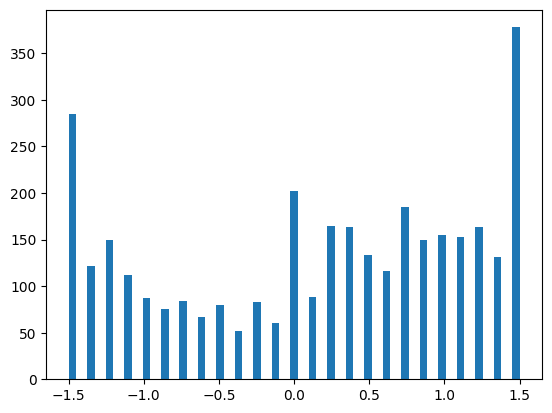

In [111]:
#@title Select the number of histogram bins

num_bins = 25 #@param {type:"slider", min:5, max:50, step:1}

hist, bins = np.histogram(df['angle'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
#plt.plot((np.min(df['angle']), np.max(df['angle'])), (samples_per_bin, samples_per_bin))

removed: 265
remaining: 3175


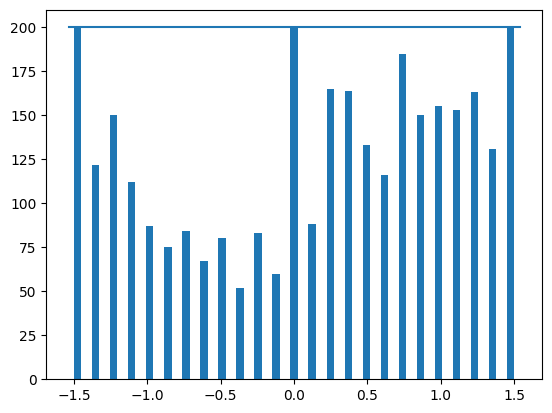

In [112]:
# Normalize the histogram (150-300 for RBG)
#@title Normalize the Histogram { run: "auto" }
hist = True #@param {type:"boolean"}
samples_per_bin = 200 # @param {"type":"integer","placeholder":"400"}

remove_list = []

if hist:
  for j in range(num_bins):
    list_ = []
    for i in range(len(df['angle'])):
      if df.loc[i,'angle'] >= bins[j] and df.loc[i,'angle'] <= bins[j+1]:
        list_.append(i)
    random.shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

  print('removed:', len(remove_list))
  df.drop(df.index[remove_list], inplace=True)
  df.reset_index(inplace=True)
  df.drop(['index'],axis=1,inplace=True)
  print('remaining:', len(df))

  hist, _ = np.histogram(df['angle'], (num_bins))
  plt.bar(center, hist, width=0.05)
  plt.plot((np.min(df['angle']), np.max(df['angle'])), (samples_per_bin, samples_per_bin))

## View a Sample Image

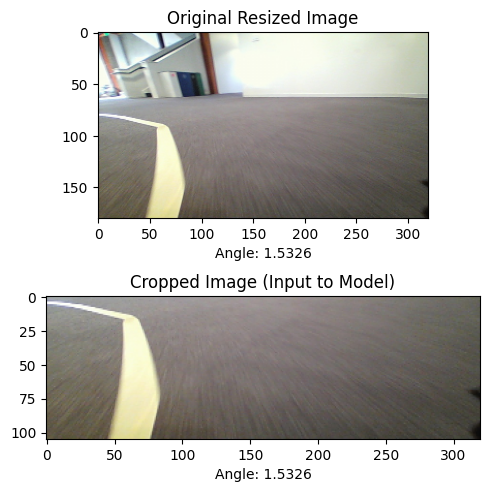

In [92]:
# View a Single Image
index = random.randint(0, df.shape[0]-1)

img_name = data_set + '/' + df.loc[index, 'filename']
angle = df.loc[index, 'angle']

# 1. Load and Fix Color
center_image = cv2.imread(img_name)
center_image_mod = cv2.resize(center_image, (320, 180))
# Convert BGR (OpenCV) to RGB (Matplotlib/Keras)
center_image_mod = cv2.cvtColor(center_image_mod, cv2.COLOR_BGR2RGB)

# 2. Crop the image
height_min = 75
height_max = center_image_mod.shape[0]
width_min = 0
width_max = center_image_mod.shape[1]

crop_img = center_image_mod[height_min:height_max, width_min:width_max]

# 3. Display with correct Subplot handling
plt.figure(figsize=(5, 5))
# Original Resized Image
plt.subplot(2, 1, 1)
plt.imshow(center_image_mod)
plt.title('Original Resized Image')
plt.grid(False)
plt.xlabel('Angle: {:.4f}'.format(angle))

# Cropped Image
plt.subplot(2, 1, 2)
plt.imshow(crop_img)
plt.title('Cropped Image (Input to Model)')
plt.grid(False)
plt.xlabel('Angle: {:.4f}'.format(angle))

plt.tight_layout() # Prevents labels from overlapping
plt.show()

## View Multiple Images

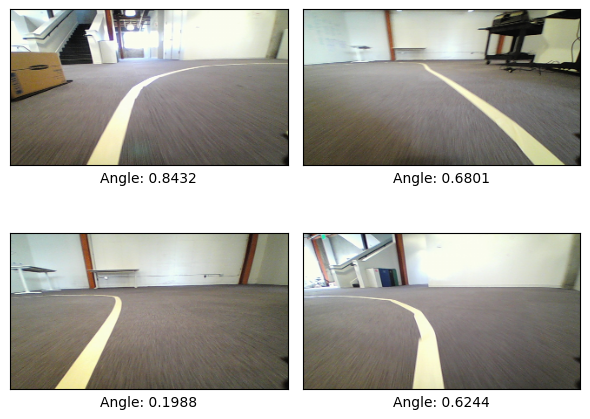

In [17]:
import math

# Number of Images to Display
num_images = 4
cols = 2
rows = math.ceil(num_images / cols)

# Create a figure for the grid
plt.figure(figsize=(6, 5))

for i in range(num_images):
    # Get random index
    index = random.randint(0, df.shape[0]-1)
    image_path = df.loc[index, 'filename']
    angle = df.loc[index, 'angle']

    # Load and process image
    img_full_path = data_set + '/' + image_path
    image = cv2.imread(img_full_path)

    # Fix 1: Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (320, 180))

    # Fix 2: Use integers for subplots
    plt.subplot(rows, cols, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    # Fix 3: Remove binary cmap (this is an RGB image)
    plt.imshow(image)
    plt.xlabel('Angle: {:.4f}'.format(angle))

# Fix 4: Tight layout and show
plt.tight_layout()
plt.show()

# Split the Dataset

## Define an ImageDataGenerator to Augment Images

[Exploring Image Data Augmentation with Keras and Tensorflow](https://medium.com/data-science/exploring-image-data-augmentation-with-keras-and-tensorflow-a8162d89b844
)



In [18]:
# Create image data augmentation generator and choose augmentation types
datagen = ImageDataGenerator(
                             #rotation_range=20,
                             zoom_range=0.15,
                             #width_shift_range=0.1,
                             #height_shift_range=0.2,
                             #shear_range=10,
                             brightness_range=[0.5,1.0],
                          	 #horizontal_flip=True,
                             #vertical_flip=True,
                             #channel_shift_range=100.0,
                             fill_mode="reflect")

## View Image Augmentation Examples

Augmenting with random_transform (Faster):



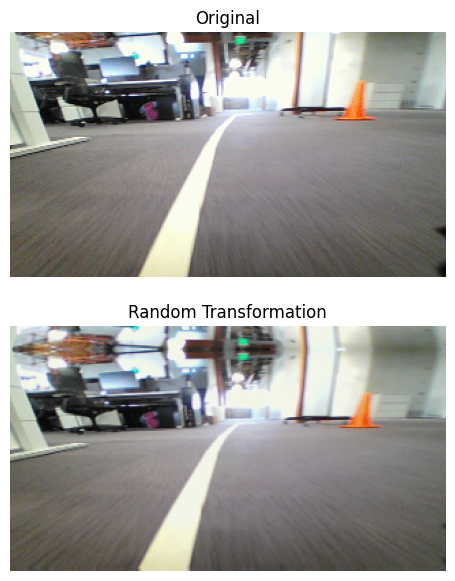


Generating 4 variants quickly:


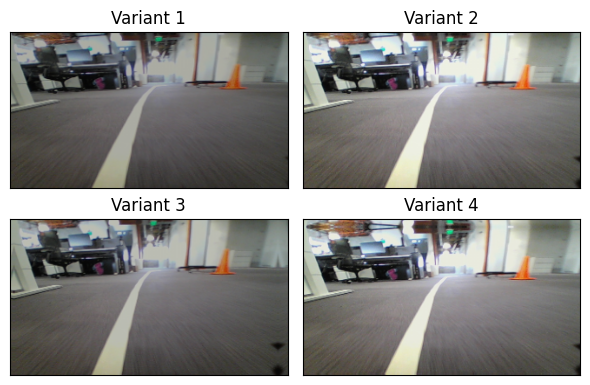

In [19]:
# 1. Load and prepare image
index = random.randint(0, df.shape[0]-1)
img_name = data_set + '/' + df.loc[index, 'filename']
label = df.loc[index, 'angle']

original_image = cv2.imread(img_name)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB) # Correct color swap
original_image = cv2.resize(original_image, (320, 180))

print("Augmenting with random_transform (Faster):\n")

# --- VISUALIZATION 1: Single Comparison ---
plt.figure(figsize=(6, 7))

# Original
plt.subplot(2, 1, 1)
plt.imshow(original_image)
plt.title("Original")
plt.axis('off')

# Augmented - Using random_transform directly on the array
image_aug = datagen.random_transform(original_image).astype('uint8')

plt.subplot(2, 1, 2)
plt.imshow(image_aug)
plt.title("Random Transformation")
plt.axis('off')
plt.show()

# --- VISUALIZATION 2: Grid of 4 variations ---
print("\nGenerating 4 variants quickly:")
plt.figure(figsize=(6, 4))

for i in range(4):
    plt.subplot(2, 2, i + 1)

    # Each call generates a new random variation (zoom/brightness)
    aug_variant = datagen.random_transform(original_image).astype('uint8')

    plt.imshow(aug_variant)
    plt.title(f"Variant {i+1}")
    plt.xticks([]); plt.yticks([])

plt.tight_layout()
plt.show()

## Define a Data Generator

In [141]:
def generator(samples, batch_size=32, aug=0):
    num_samples = len(samples)

    while 1:  # Loop forever
        # Shuffle the data at the start of every epoch
        random.shuffle(samples)

        for offset in range(0, num_samples, batch_size):
            batch_samples = samples[offset:offset + batch_size]

            images = []
            angles = []

            for batch_sample in batch_samples:
                try:
                    # Logic Check: Ensure we aren't processing the header row
                    # index 3 = filename, index 4 = angle
                    if batch_sample[3] == "filename":
                        continue

                    name = data_set + '/' + batch_sample[3]
                    center_image = cv2.imread(name)

                    if center_image is None:
                        continue

                    center_image = cv2.cvtColor(center_image, cv2.COLOR_BGR2RGB)
                    center_image = cv2.resize(center_image, (320, 180))
                    angle = float(batch_sample[4])

                    # 2. APLICAR FACTOR DE AGRESIVIDAD
                    # Si el ángulo es mayor a 0.1 (curva), lo multiplicamos
                    #if abs(angle) > 0.5:
                    #    angle = angle * 1.3  # Aumenta la fuerza un 30%

                    # 3. Limitar al rango físico del coche
                    #angle = np.clip(angle, -1.5, 1.5)

                    if not aug:
                        images.append(center_image)
                        angles.append(angle)
                    else:
                        # FAST AUGMENTATION using random_transform
                        image_aug = datagen.random_transform(center_image)

                        # Manual Flip logic (Horizontal)
                        if random.random() < 0.5:
                            image_aug = cv2.flip(image_aug, 1)
                            angle = -angle

                        images.append(image_aug)
                        angles.append(angle)
                except Exception as e:
                    # Skip rows that cause issues
                    continue

            # CRITICAL FIX: Only yield if we actually have images
            # This prevents the "IndexError: list index out of range"
            if len(images) > 0:
                X_train = np.array(images)
                y_train = np.array(angles)

                # Unpack the list from shuffle into a tuple (X, y)
                X_shuffled, y_shuffled = sklearn.utils.shuffle(X_train, y_train)
                yield (X_shuffled, y_shuffled)

## Split the Dataset

In [113]:
# Convert to list of lists
samples = df.values.tolist()

# FIX: You must assign the result of shuffle back to the variable
samples = sklearn.utils.shuffle(samples)

# Split the data
train_samples, validation_samples = train_test_split(samples, test_size=0.2)

print("Number of training samples: ", len(train_samples))
print("Number of validation samples: ", len(validation_samples))

Number of training samples:  2540
Number of validation samples:  635


## Define Training and Validation Data Generators

In [142]:
batch_size_value = 32
img_aug = 0

train_generator = generator(train_samples, batch_size=batch_size_value, aug=img_aug)
validation_generator = generator(
    validation_samples, batch_size=batch_size_value, aug=0)

# Compile and Train the Model

## Build the Model

In [96]:
# Initialize the model
model = Sequential()

# trim image to only see section with road
# (top_crop, bottom_crop), (left_crop, right_crop)
model.add(Cropping2D(cropping=((height_min,0), (width_min,0)), input_shape=(180,320,3)))

# Preprocess incoming data, centered around zero with small standard deviation
model.add(Lambda(lambda x: (x / 255.0) - 0.5))

# Nvidia model
model.add(Conv2D(24, (5, 5), activation="relu", name="conv_1", strides=(2, 2)))
model.add(Conv2D(36, (5, 5), activation="relu", name="conv_2", strides=(2, 2)))
model.add(Conv2D(48, (5, 5), activation="relu", name="conv_3", strides=(2, 2)))
model.add(SpatialDropout2D(0.5))

model.add(Conv2D(64, (3, 3), activation="relu", name="conv_4", strides=(1, 1)))
model.add(Conv2D(64, (3, 3), activation="relu", name="conv_5", strides=(1, 1)))

model.add(Flatten())

model.add(Dense(1164))
model.add(Dropout(.5))
model.add(Dense(100, activation='relu'))
model.add(Dropout(.5))
model.add(Dense(50, activation='relu'))
model.add(Dropout(.5))
model.add(Dense(10, activation='relu'))
model.add(Dropout(.5))
model.add(Dense(1))

model.compile(loss='mse', optimizer=Adam(learning_rate=0.001),
              metrics=['mse','mae','cosine_similarity'])

# Print model sumamry
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ cropping2d_2 (Cropping2D)       │ (None, 105, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_2 (Lambda)               │ (None, 105, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 51, 158, 24)    │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 24, 77, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_3 (Conv2D)                 │ (None, 10, 37, 48)     │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout2d_2             │ (None, 10, 37, 48)     │             0 │
│ (SpatialDropout2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_4 (Conv2D)                 │ (None, 8, 35, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_5 (Conv2D)                 │ (None, 6, 33, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 12672)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1164)           │    14,751,372 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 1164)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 100)            │       116,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,004,791 (57.24 MB)

 Trainable params: 15,004,791 (57.24 MB)

 Non-trainable params: 0 (0.00 B)

## Setup Checkpoints

In [97]:
# checkpoint
model_path = './model'

!if [ -d $model_path ]; then echo 'Directory Exists'; else mkdir $model_path; fi

filepath = model_path + "/weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
checkpoint = ModelCheckpoint(
    filepath,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='auto',
    save_freq='epoch'
)

Directory Exists


## Setup Early Stopping to Prevent Overfitting

In [98]:
# The patience parameter is the amount of epochs to check for improvement
early_stop = EarlyStopping(monitor='val_loss', patience=10)

## Reduce Learning Rate When a Metric has Stopped Improving

In [99]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.001)

## Setup Tensorboard

[Tensorboard Documentation](https://keras.io/callbacks/#tensorboard)

In [27]:
# 1. Clear previous logs (optional but recommended)
!rm -rf ./logs/

# 2. Configure the native TensorBoard Callback
# Note: Keras 3 renamed some arguments (e.g., 'write_grads' is no longer used)
tbCallBack = TensorBoard(log_dir='./logs',
                        histogram_freq=1,
                        write_graph=True,
                        write_images=True,
                        update_freq='epoch')

# 3. Launch TensorBoard directly in the notebook
%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

## Load Existing Model

In [124]:
load = True #@param {type:"boolean"}
model_name = "weights-improvement-09-0.20.keras" # @param {"type":"string"}

if load:
  # Returns a compiled model identical to the previous one
  model_path_full = model_path + '/' + model_name
  model = load_model(model_path_full, safe_mode=False)
  print("Loaded previous model: {} \n".format(model_path_full))
else:
  print("No previous model loaded \n")

Loaded previous model: ./model/weights-improvement-09-0.20.keras 




## Train the Model

In [143]:
import math

# 1. Define step sizes (Calculated as integers)
# We use math.ceil to ensure we don't miss the last partial batch
STEP_SIZE_TRAIN = math.ceil(len(train_samples) / batch_size_value)
STEP_SIZE_VALID = math.ceil(len(validation_samples) / batch_size_value)

# 2. Define number of epochs
n_epoch = 200

# 3. Define callbacks
# REPLACED: TensorBoardColabCallback(tbc) with the native tbCallBack we defined earlier
# This assumes early_stop, checkpoint, and reduce_lr are defined in previous cells
callbacks_list = [tbCallBack, early_stop, checkpoint, reduce_lr]

# 4. Fit the model
# UPDATED: Use model.fit instead of fit_generator
# REMOVED: use_multiprocessing=True (prevents pickling errors in Colab)
history_object = model.fit(
    train_generator,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=validation_generator,
    validation_steps=STEP_SIZE_VALID,
    callbacks=callbacks_list,
    epochs=n_epoch,
    verbose=1
)

Epoch 1/200
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - cosine_similarity: 0.7720 - loss: 0.4741 - mae: 0.5556 - mape: 17273040.0000 - mse: 0.4741
Epoch 1: val_loss did not improve from 0.19923
80/80 ━━━━━━━━━━━━━━━━━━━━ 28s 277ms/step - cosine_similarity: 0.7717 - loss: 0.4744 - mae: 0.5557 - mape: 17319204.0000 - mse: 0.4744 - val_cosine_similarity: 0.7543 - val_loss: 0.3801 - val_mae: 0.5089 - val_mape: 25566018.0000 - val_mse: 0.3801 - learning_rate: 0.0010
Epoch 2/200
79/80 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - cosine_similarity: 0.7414 - loss: 0.5314 - mae: 0.5914 - mape: 18872232.0000 - mse: 0.5314
Epoch 2: val_loss did not improve from 0.19923
80/80 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - cosine_similarity: 0.7409 - loss: 0.5316 - mae: 0.5914 - mape: 18916814.0000 - mse: 0.5316 - val_cosine_similarity: 0.7276 - val_loss: 0.3997 - val_mae: 0.5433 - val_mape: 29271952.0000 - val_mse: 0.3997 - learning_rate: 0.0010
Epoch 3/200
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - cosine_similari

## Save the Model

In [144]:
# Save model
model_path_full = model_path + '/'

# Save the entire model (architecture + weights + optimizer state)
model.save(model_path_full + 'final_model.keras')
print(f"Model saved successfully to {model_path_full}final_model.keras")

Model saved successfully to ./model/final_model.keras


# Evaluate the Model

## Plot the Training Results

Generating loss chart...


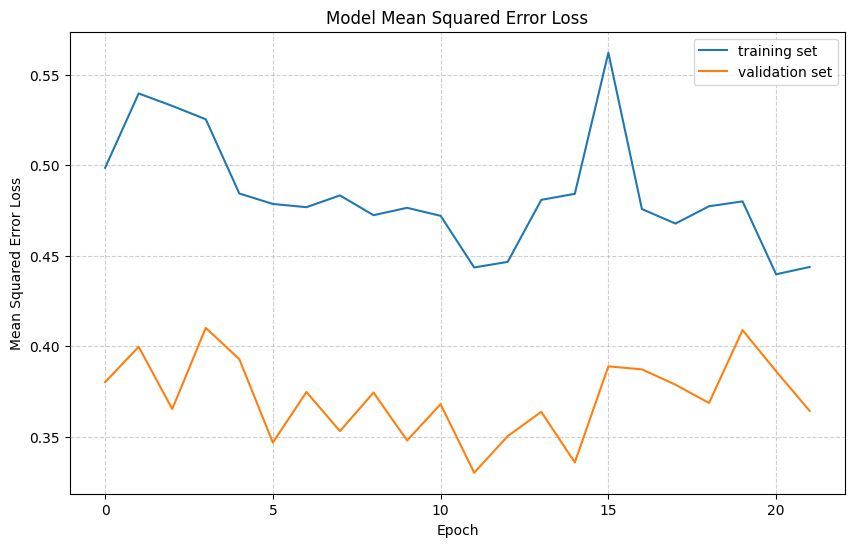

Done.


In [145]:
# Plot the training and validation loss for each epoch
print('Generating loss chart...')
plt.figure(figsize=(10, 6)) # Make it a bit larger for better visibility

plt.plot(history_object.history['loss'], label='training set')
plt.plot(history_object.history['val_loss'], label='validation set')

plt.title('Model Mean Squared Error Loss')
plt.ylabel('Mean Squared Error Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6) # Adds a subtle grid for easier reading

# Save the plot
plt.savefig(model_path_full + 'model_loss.png')

# Show the plot in the notebook
plt.show()

print('Done.')

## Print Performance Metrics

In [146]:
# 1. Evaluate the model using model.evaluate (kera 3.0)
metrics = model.evaluate(validation_generator, steps=STEP_SIZE_VALID, return_dict=True)

# 2. Map metrics to scores properly
print("\n--- Detailed Evaluation Results ---")
for metric, value in metrics.items():
    print(f"{metric:18} : {value:.4f}")


20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - cosine_similarity: 0.7679 - loss: 0.3519 - mae: 0.4730 - mape: 19561316.0000 - mse: 0.3519

--- Detailed Evaluation Results ---
cosine_similarity  : 0.7465
loss               : 0.3662
mae                : 0.4823
mape               : 26891436.0000
mse                : 0.3662


1. Cosine Similarity: (Similitud de Coseno): Mide la dirección. Indica qué tan bien coinciden la orientación de tus predicciones con los ángulos reales. En navegación autónoma, un valor cercano a 1 significa que el vehículo sabe hacia dónde girar (izquierda o derecha) de forma correcta, aunque el ángulo no sea exacto.
2. MSE (Error Cuadrático Medio): Es la métrica de estabilidad. Al elevar los errores al cuadrado, penaliza mucho más los errores grandes (como girar a la derecha cuando el camino va a la izquierda). Un MSE bajo significa que el modelo ha eliminado los giros peligrosos.
3. MAE (Error Absoluto Medio): Representa la precisión. Es el promedio del error real del giro del timón. (En el caso actual, entre -1.5 y 1.5). Indica, en promedio, qué tan lejos está el timón de la posición ideal en cada momento.

Generando predicciones para el gráfico de residuos...


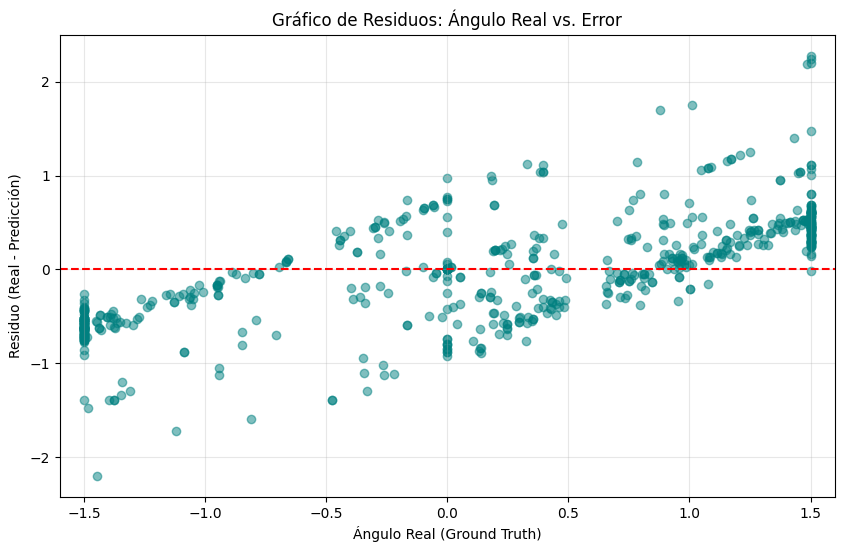

In [147]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Obtener predicciones y valores reales del generador de validación
# Usaremos un número representativo de pasos (steps)
all_actual = []
all_preds = []

print("Generando predicciones para el gráfico de residuos...")
for i in range(STEP_SIZE_VALID):
    images, angles = next(validation_generator)
    preds = model.predict(images, verbose=0)

    all_actual.extend(angles)
    all_preds.extend(preds.flatten())

all_actual = np.array(all_actual)
all_preds = np.array(all_preds)

# 2. Calcular los residuos (Valor Real - Predicción)
residuals = all_actual - all_preds

# 3. Crear el gráfico
plt.figure(figsize=(10, 6))
plt.scatter(all_actual, residuals, alpha=0.5, color='teal')
plt.axhline(y=0, color='red', linestyle='--') # Línea de error cero

plt.title('Gráfico de Residuos: Ángulo Real vs. Error')
plt.xlabel('Ángulo Real (Ground Truth)')
plt.ylabel('Residuo (Real - Predicción)')
plt.grid(True, alpha=0.3)

# Opcional: Mostrar los límites de tu dirección
plt.xlim([-1.6, 1.6])
plt.show()

## Compute Prediction Statistics

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
[INFO] mean: 24692.37%, std: 133159.86%
count    200.000000
mean       0.031646
std        0.419687
min       -1.403644
25%       -0.236033
50%        0.033511
75%        0.322930
max        1.411454
dtype: float64


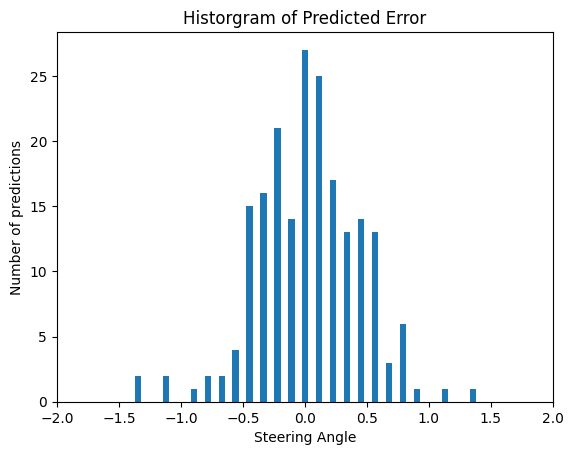

In [148]:
# Define image loading function
def load_images(dataframe):

  # initialize images array
  images = []

  for i in dataframe.index.values:
    name = data_set + '/' + dataframe.loc[i,'filename']
    center_image = cv2.imread(name)
    # IMPORTANT: Convert to RGB to match training data
    center_image = cv2.cvtColor(center_image, cv2.COLOR_BGR2RGB)
    center_image = cv2.resize(center_image, (320,180))
    images.append(center_image)

  return np.array(images)

# Load images
test_size = 200
df_test = df.sample(frac=1).reset_index(drop=True)
df_test = df_test.head(test_size)

test_images = load_images(df_test)

batch_size = 32
preds = model.predict(test_images, batch_size=batch_size, verbose=1)

#print("Preds: {} \n".format(preds))

testY = df_test.iloc[:,4].values

#print("Labels: {} \n".format(testY))

df_testY = pd.Series(testY)
df_preds = pd.Series(preds.flatten())

# Replace 0 angle values
if df_testY.eq(0).any():
  df_testY.replace(0, 0.0001,inplace=True)

# Calculate the difference
diff = preds.flatten() - df_testY
percentDiff = (diff / testY) * 100
absPercentDiff = np.abs(percentDiff)

# compute the mean and standard deviation of the absolute percentage
# difference
mean = np.mean(absPercentDiff)
std = np.std(absPercentDiff)
print("[INFO] mean: {:.2f}%, std: {:.2f}%".format(mean, std))

# Compute the mean and standard deviation of the difference
print(diff.describe())

# Plot a histogram of the prediction errors
num_bins = 25
hist, bins = np.histogram(diff, num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.title('Historgram of Predicted Error')
plt.xlabel('Steering Angle')
plt.ylabel('Number of predictions')
plt.xlim(-2.0, 2.0)
plt.plot(np.min(diff), np.max(diff))

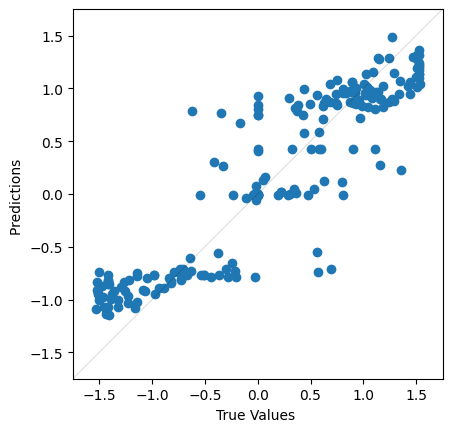

In [149]:
# Plot a Scatter Plot of the Error
plt.scatter(testY, preds)
plt.xlabel('True Values ')
plt.ylabel('Predictions ')
plt.axis('equal')
plt.axis('square')
plt.xlim([-1.75,1.75])
plt.ylim([-1.75,1.75])
plt.plot([-1.75, 1.75], [-1.75, 1.75], color='k', linestyle='-', linewidth=.1)

## Plot a Prediction

/tmp/ipython-input-2524943970.py:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.xlabel('Actual: {:.2f} Predicted: {:.2f}'.format(df_test.loc[index,'angle'],float(preds[index])))


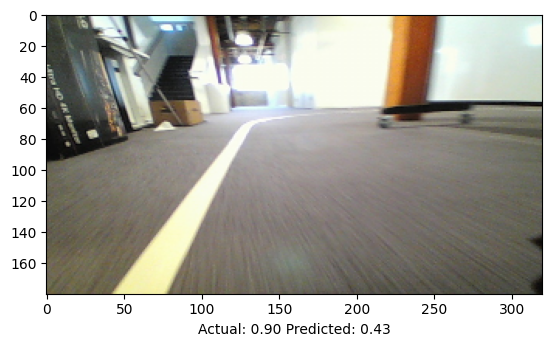

In [150]:
# Plot the image with the actual and predicted steering angle
index = random.randint(0,df_test.shape[0]-1)
img_name = data_set + '/' + df_test.loc[index,'filename']
center_image = cv2.imread(img_name)
center_image = cv2.cvtColor(center_image,cv2.COLOR_RGB2BGR)
center_image_mod = cv2.resize(center_image, (320,180)) #resize from 720x1280 to 180x320
plt.imshow(center_image_mod)
plt.grid(False)
plt.xlabel('Actual: {:.2f} Predicted: {:.2f}'.format(df_test.loc[index,'angle'],float(preds[index])))
plt.show()


#Visualize the Network
https://www.analyticsvidhya.com/blog/2019/05/understanding-visualizing-neural-networks/

##Show the Model Summary

In [39]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ cropping2d (Cropping2D)         │ (None, 105, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 105, 320, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 51, 158, 24)    │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 24, 77, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_3 (Conv2D)                 │ (None, 10, 37, 48)     │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout2d               │ (None, 10, 37, 48)     │             0 │
│ (SpatialDropout2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_4 (Conv2D)                 │ (None, 8, 35, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_5 (Conv2D)                 │ (None, 6, 33, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12672)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1164)           │    14,751,372 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1164)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │       116,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,014,375 (171.72 MB)

 Trainable params: 15,004,791 (57.24 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 30,009,584 (114.48 MB)

##Access Individual Layers

In [137]:
# Creating a mapping of layer name ot layer details
# We will create a dictionary layers_info which maps a layer name to its charcteristics
layers_info = {}
for i in model.layers:
    layers_info[i.name] = i.get_config()

#here the layer_weights dictionary will map every layer_name to its corresponding weights
layer_weights = {}
for i in model.layers:
    layer_weights[i.name] = i.get_weights()

pprint.pprint(layers_info['conv_5'])

{'activation': 'relu',
 'activity_regularizer': None,
 'bias_constraint': None,
 'bias_initializer': {'class_name': 'Zeros',
                      'config': {},
                      'module': 'keras.initializers',
                      'registered_name': None},
 'bias_regularizer': None,
 'data_format': 'channels_last',
 'dilation_rate': (1, 1),
 'dtype': {'class_name': 'DTypePolicy',
           'config': {'name': 'float32'},
           'module': 'keras',
           'registered_name': None},
 'filters': 64,
 'groups': 1,
 'kernel_constraint': None,
 'kernel_initializer': {'class_name': 'GlorotUniform',
                        'config': {'seed': None},
                        'module': 'keras.initializers',
                        'registered_name': None},
 'kernel_regularizer': None,
 'kernel_size': (3, 3),
 'name': 'conv_5',
 'padding': 'valid',
 'strides': (1, 1),
 'trainable': True,
 'use_bias': True}


##Visualize the filters

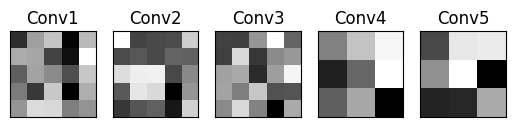

In [138]:
# Visualize the first filter of each convolution layer
layers = model.layers
layer_ids = [2,3,4,6,7]

#plot the filters
fig,ax = plt.subplots(nrows=1,ncols=5)
for i in range(5):
    ax[i].imshow(layers[layer_ids[i]].get_weights()[0][:,:,:,0][:,:,0],cmap='gray')
    ax[i].set_title('Conv'+str(i+1))
    ax[i].set_xticks([])
    ax[i].set_yticks([])

##Visualize the Saliency Map

https://colab.research.google.com/github/idealo/cnn-exposed/blob/master/notebooks/Attribution.ipynb#scrollTo=jqSOW0pQniCw

https://www.analyticsvidhya.com/blog/2019/05/understanding-visualizing-neural-networks/

https://github.com/raghakot/keras-vis/blob/master/applications/self_driving/visualize_attention.ipynb

In [42]:
!pip install tf-keras-vis tensorflow

# import specific functions from keras-vis package
#from vis.utils import utils
#from vis.visualization import visualize_saliency, visualize_cam, overlay

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 3.2 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer
Received: inputs=['Tensor(shape=(1, 180, 320, 3))']
  warnings.warn(msg)


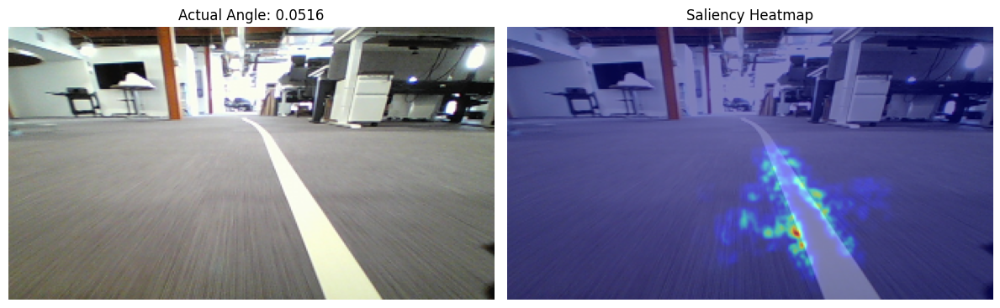

In [139]:
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils.scores import BinaryScore
import scipy.ndimage as ndimage

# --- Setup Data ---
index = random.randint(0, df.shape[0]-1)
img_name = data_set + '/' + df.loc[index, 'filename']
angle = df.loc[index, 'angle']

sample_image = cv2.imread(img_name)
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
sample_image_mod = cv2.resize(sample_image, (320, 180))

# --- Saliency Map Logic ---

# 1. Initialize Saliency
# In newer versions, we can pass keepdims=True here if needed
saliency = Saliency(model, model_modifier=None, clone=False)

# 2. Define the score targeting the steering angle
score = BinaryScore(angle)

# 3. Generate saliency map
# Ensure input is float32 and has batch dimension
input_data = np.expand_dims(sample_image_mod, axis=0).astype(np.float32)

# FIX: Remove 'backprop_modifier' from the call.
# New versions handle the gradient calculation internally.
grads = saliency(score, input_data)

# --- Visualization ---
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title(f"Actual Angle: {angle:.4f}")
plt.imshow(sample_image_mod)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Saliency Heatmap")
plt.imshow(sample_image_mod)
# The output 'grads' is usually (batch, height, width)
# Higher sigma = smoother/blurrier heatmap
smoothed_grads = ndimage.gaussian_filter(grads[0], sigma=1)
plt.imshow(smoothed_grads, cmap='jet', alpha=0.5)
plt.axis('off')

plt.tight_layout()
plt.show()

# References:
https://www.pyimagesearch.com/2019/01/28/keras-regression-and-cnns/
https://www.pyimagesearch.com/2019/01/21/regression-with-keras/
https://www.pyimagesearch.com/2018/12/24/how-to-use-keras-fit-and-fit_generator-a-hands-on-tutorial/
https://colab.research.google.com/github/tensorflow/examples/blob/master/courses/udacity_intro_to_tensorflow_for_deep_learning/l04c01_image_classification_with_cnns.ipynb#scrollTo=7MqDQO0KCaWS

[Keras Image Processing Documentation](https://keras.io/preprocessing/image/)